In [1]:
import os
from IPython.display import clear_output
%pip install wandb==0.16.0 -q
%pip install --upgrade datasets -q
%pip install efficientnet
%pip install aiffel7
%pip install git+https://github.com/tensorflow/examples.git
clear_output(wait=False)

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import os
import albumentations as A
from tensorflow_examples.models.pix2pix import pix2pix
from tensorflow import keras
import math
import random
import pickle
from skimage.io import imread, imshow,show
from skimage.transform import resize
from glob import glob
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

import keras.backend as K

2024-02-02 10:42:00.369258: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-02 10:42:00.709713: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-02 10:42:00.709781: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-02 10:42:00.764620: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-02 10:42:00.879673: I tensorflow/core/platform/cpu_feature_guar

In [3]:
from datasets import load_dataset
dataset = load_dataset("nateraw/pascal-voc-2012")

In [4]:
IMG_HEIGHT = 256
IMG_WIDTH  = 256

In [5]:
print("데이터셋 정보:")
print(dataset)

데이터셋 정보:
DatasetDict({
    train: Dataset({
        features: ['image', 'mask'],
        num_rows: 1464
    })
    val: Dataset({
        features: ['image', 'mask'],
        num_rows: 1449
    })
})


In [6]:
test_dataset=dataset["train"]

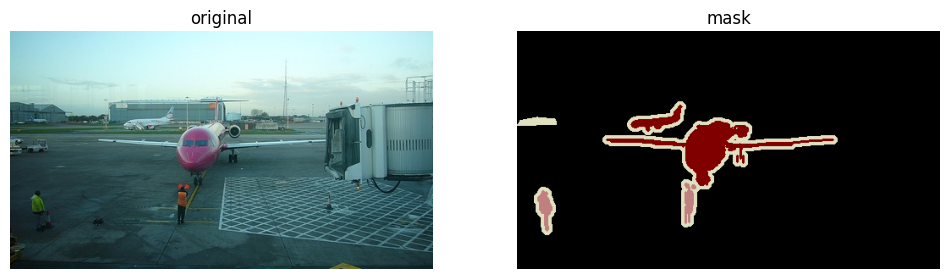

In [7]:
# 첫 번째 데이터 샘플을 로드
first_sample = test_dataset[0]
image = first_sample['image']
mask = first_sample['mask']

# 이미지와 마스크 표시
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# 원본 이미지
ax[0].imshow(image)
ax[0].set_title('original')
ax[0].axis('off')

# 마스크 이미지
ax[1].imshow(mask)
ax[1].set_title('mask')
ax[1].axis('off')

plt.show()

In [8]:
from PIL import Image
import numpy as np

# 이미지와 마스크를 NumPy 배열로 변환
input_images = np.array(test_dataset[0]['image'])
input_labels = np.array(test_dataset[0]['mask'])

# 변환된 배열의 형태 확인
print("Images shape:", input_images.shape)
print("Labels shape:", input_labels.shape)

Images shape: (281, 500, 3)
Labels shape: (281, 500, 3)


In [9]:
import numpy as np
from PIL import Image

def extract_class_color_mapping(masks):
    """
    마스크 이미지들에서 클래스별 색상 매핑을 추출하는 함수
    :param masks: 마스크 이미지의 리스트
    :return: 클래스와 색상의 매핑 딕셔너리
    """
    color_mapping = {}
    class_id = 0

    for mask in masks:
        # 마스크 이미지를 NumPy 배열로 변환
        mask_np = np.array(mask)
        # 고유한 색상 찾기
        unique_colors = np.unique(mask_np.reshape(-1, mask_np.shape[2]), axis=0)

        for color in unique_colors:
            # 색상을 튜플로 변환
            color_tuple = tuple(color)
            # 새로운 색상이면 클래스 ID 할당
            if color_tuple not in color_mapping:
                color_mapping[color_tuple] = class_id
                class_id += 1

    return color_mapping




def map_integer_mask_to_color(integer_mask, reverse_mapping):
    color_mask = np.zeros((integer_mask.shape[0], integer_mask.shape[1], 3), dtype=np.uint8)
    for row in range(integer_mask.shape[0]):
        for col in range(integer_mask.shape[1]):
            class_idx = integer_mask[row, col]
            color = reverse_mapping[class_idx]
            # 컬러 값을 [0, 255] 범위로 스케일링
            scaled_color = np.clip(color, 0, 255)
            color_mask[row, col] = scaled_color

    return color_mask
def create_inverse_mapping(class_color_mapping):
    """
    클래스 ID에서 색상으로의 역 매핑을 생성하는 함수
    :param class_color_mapping: 클래스와 색상의 매핑 딕셔너리
    :return: 역 매핑 딕셔너리
    """
    inverse_mapping = {class_id: color for color, class_id in class_color_mapping.items()}
    return inverse_mapping

In [10]:

# 데이터셋에서 마스크 목록 추출
masks = [sample['mask'] for sample in test_dataset]
pickle_file = 'class_color_mapping.pkl'
if not os.path.exists(pickle_file):
    # masks 변수는 이미 정의되어 있어야 합니다.
    class_color_mapping = extract_class_color_mapping(masks)

    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file, 'wb') as file:
        pickle.dump(class_color_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file, 'rb') as file:
        class_color_mapping = pickle.load(file)

In [11]:
pickle_file_inverse_mapping = 'inverse_mapping.pkl'
if not os.path.exists(pickle_file_inverse_mapping):

    inverse_mapping = create_inverse_mapping(class_color_mapping)
    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file_inverse_mapping, 'wb') as file:
        pickle.dump(inverse_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file_inverse_mapping, 'rb') as file:
        inverse_mapping = pickle.load(file)

In [12]:
print(class_color_mapping)
print(inverse_mapping)

{(0, 0, 0): 0, (128, 0, 0): 1, (192, 128, 128): 2, (224, 224, 192): 3, (0, 64, 128): 4, (64, 0, 128): 5, (192, 0, 0): 6, (128, 128, 0): 7, (128, 0, 128): 8, (0, 0, 128): 9, (192, 128, 0): 10, (128, 192, 0): 11, (64, 128, 128): 12, (192, 0, 128): 13, (64, 128, 0): 14, (0, 128, 0): 15, (128, 128, 128): 16, (64, 0, 0): 17, (0, 192, 0): 18, (0, 128, 128): 19, (0, 64, 0): 20, (128, 64, 0): 21}
{0: (0, 0, 0), 1: (128, 0, 0), 2: (192, 128, 128), 3: (224, 224, 192), 4: (0, 64, 128), 5: (64, 0, 128), 6: (192, 0, 0), 7: (128, 128, 0), 8: (128, 0, 128), 9: (0, 0, 128), 10: (192, 128, 0), 11: (128, 192, 0), 12: (64, 128, 128), 13: (192, 0, 128), 14: (64, 128, 0), 15: (0, 128, 0), 16: (128, 128, 128), 17: (64, 0, 0), 18: (0, 192, 0), 19: (0, 128, 128), 20: (0, 64, 0), 21: (128, 64, 0)}


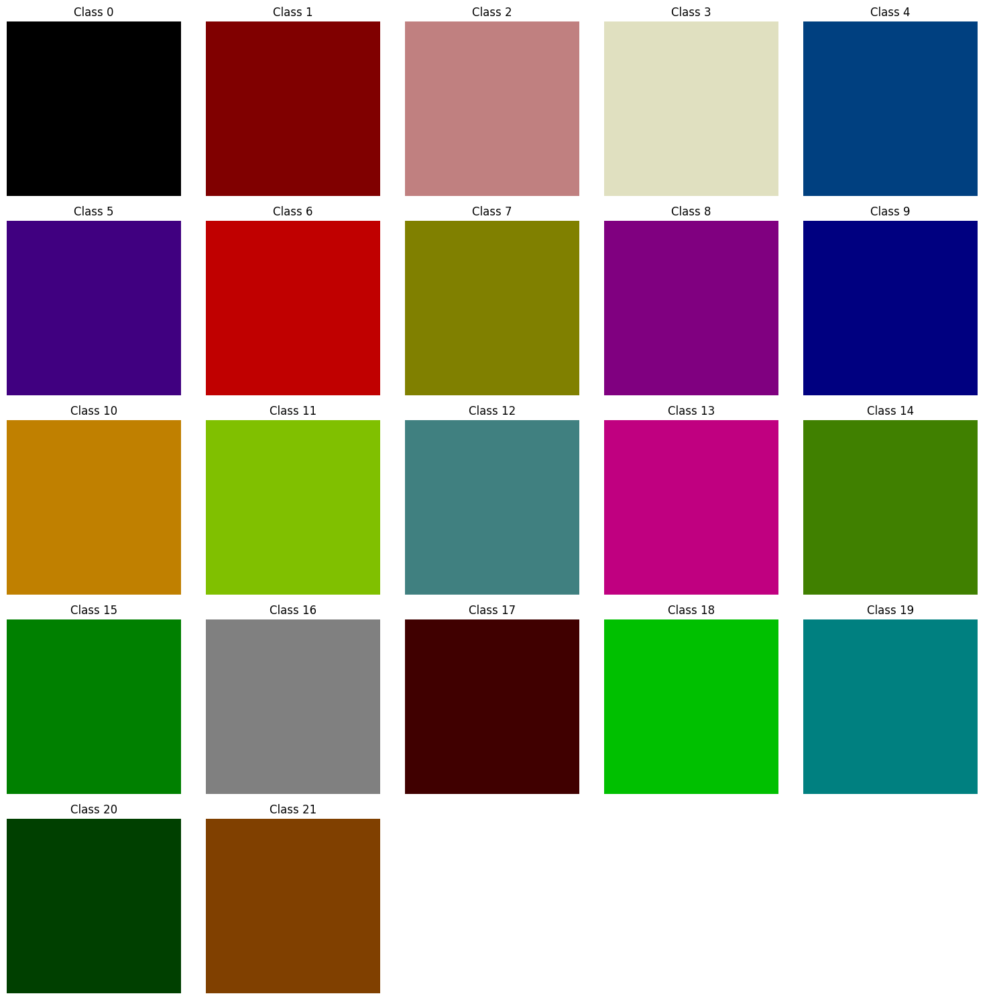

In [13]:
# 5행 5열의 서브플롯 생성
plt.figure(figsize=(15, 15))
for class_id, color in inverse_mapping.items():
    ax = plt.subplot(5, 5, class_id + 1)
    ax.set_title(f"Class {class_id}")
    ax.imshow(np.full((10, 10, 3), color, dtype=np.uint8))  # 색상으로 채운 작은 이미지 생성
    ax.axis('off')

# 나머지 빈 서브플롯 숨기기
for i in range(len(inverse_mapping) + 1, 26):
    ax = plt.subplot(5, 5, i)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [15]:
from PIL import ImageOps
def map_colors_to_labels(seg, color_mapping):
    # 세그멘테이션 마스크의 높이와 너비를 얻습니다.
    height, width = seg.shape[:2]
    non_zero_indices = np.nonzero(seg)

    # 행과 열 인덱스를 튜플로 묶어 딕셔너리 생성
    index_dict = {}

    for i in range(len(non_zero_indices[0])):
        key = (non_zero_indices[0][i], non_zero_indices[1][i])
        index_dict[key] = 1
    # 새로운 레이블 배열을 생성합니다.
    label_seg = np.zeros((height, width), dtype=np.int32)
    for i in index_dict.keys():

        y = i[0]
        x = i[1]

        # 현재 픽셀의 RGB 값을 가져옵니다.
        pixel = tuple(seg[y, x])

        # RGB 값에 해당하는 레이블을 찾아 할당합니다.
        label_seg[y, x] = color_mapping.get(pixel, 0)  # 기본값으로 0을 사용

    return label_seg
def data_concat(dataset):

    img_arr = []
    seg_arr = []

    img_arr_temp = dataset['train']['image'] + dataset['val']['image']

    seg_arr_temp = dataset['train']['mask'] + dataset['val']['mask']

    for img, seg in zip(img_arr_temp, seg_arr_temp):
        img = np.array(img.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        seg = np.array(seg.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        label_seg = map_colors_to_labels(seg, class_color_mapping)
        img_arr.append(img)
        seg_arr.append(label_seg)

    return np.array(img_arr), np.array(seg_arr)

In [16]:
full_dataset = tf.data.Dataset.from_tensor_slices(data_concat(dataset))
print(full_dataset)

2024-02-02 10:45:59.336604: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-02 10:45:59.417247: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-02 10:45:59.420782: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

<_TensorSliceDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(256, 256), dtype=tf.int32, name=None))>


In [17]:
DATASET_SIZE = 2913
train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.2 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)

full_dataset = full_dataset.shuffle(buffer_size = DATASET_SIZE)
train_dataset = full_dataset.take(train_size)
test_dataset = full_dataset.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

In [18]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

def load_image_train(input_image, input_mask):
    input_mask = input_mask[ ..., np.newaxis]


    # random flip the image and mask
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    input_mask = input_mask[:, :, 0]
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask
def load_image_test(input_image, input_mask):
    input_mask = input_mask[np.newaxis, ...]


    input_mask = input_mask[0]
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [19]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = train_size // BATCH_SIZE
train = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val = train_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = test_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)
val_dataset = val.batch(BATCH_SIZE)

In [21]:
# 저장된 모델의 경로
model_path_unet_e = './UNET_effecientTP.keras'
# 모델 로드
model_ue = tf.keras.models.load_model(model_path_unet_e)

In [22]:
# 저장된 모델의 경로
model_path_unet_m = './UNET_mobile.keras'
# 모델 로드
model_um = tf.keras.models.load_model(model_path_unet_m)

In [23]:
@tf.keras.utils.register_keras_serializable()
def iou_score(target, prediction):
    target = tf.squeeze(target,-1)
    target = tf.convert_to_tensor(target, dtype=tf.float32)
    prediction = tf.convert_to_tensor(prediction, dtype=tf.float32)

    intersection = tf.reduce_sum(tf.cast(tf.logical_and(tf.cast(target, tf.bool), tf.cast(prediction, tf.bool)), tf.float32))
    union = tf.reduce_sum(tf.cast(tf.logical_or(tf.cast(target, tf.bool), tf.cast(prediction, tf.bool)), tf.float32))

    iou_score = tf.math.divide_no_nan(intersection, union)

    return iou_score

In [24]:
# 저장된 모델의 경로
model_path_deeplab = './deeplabv3.keras'

# 모델 로드
model_deeplab = tf.keras.models.load_model(model_path_deeplab, custom_objects={'iou_score': iou_score})

In [25]:
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU

# 가정: y_true와 y_pred는 모델에 의해 예측된 세그멘테이션 마스크와 실제 마스크입니다.
# 이들은 모두 동일한 형태(shape)를 가지며, 각 픽셀의 클래스 레이블을 포함합니다.
# num_classes는 데이터셋에 있는 클래스의 총 수입니다.

def calculate_miou(y_true, y_pred, num_classes):

    # MeanIoU 객체를 생성합니다.
    miou = MeanIoU(num_classes=num_classes)
    # 업데이트 메소드를 호출하여 실제 값과 예측 값을 전달합니다.
    miou.update_state(y_true, y_pred)
    # 결과를 계산합니다.
    result = miou.result().numpy()  # TensorFlow 2.x에서는 .numpy()를 호출하여 값을 얻습니다.
    return result

In [26]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(np.array(display_list[i]))
        plt.axis('off')
    plt.show()

In [27]:
import numpy as np
import tensorflow as tf

num_classes = 21

def calculate_miou_custom(model_list, num_classes):
    # 테스트 데이터셋에서 모델 예측 수행
    for image, mask in test_dataset.take(10):

        for model_name, model in model_list.items():
          y_pred = model.predict(image)
          y_true = mask

          y_pred = tf.argmax(y_pred, axis=-1)
          y_pred = np.squeeze(y_pred[..., tf.newaxis],-1)

          display([image[0], y_true[0], y_pred[0]])

          # MeanIoU 인스턴스 생성
          iou_metric = MeanIoU(num_classes=num_classes)

          # 업데이트
          iou_metric.update_state(y_true, y_pred)

          # confusion matrix 얻기
          conf_mat = iou_metric.get_weights()[0]

          # 각 클래스별 IoU 계산
          ious = []
          for i in range(num_classes):
              # 대각선 값은 교차, 행의 합과 열의 합은 합집합을 나타냄
              true_positives = conf_mat[i, i]
              false_negatives = np.sum(conf_mat[i, :]) - true_positives
              false_positives = np.sum(conf_mat[:, i]) - true_positives
              iou = true_positives / (true_positives + false_positives + false_negatives)
              ious.append(iou)

          # 출력
          print(f"{model_name} Class-wise IoU:", ious)

          # 0.5보다 큰 값들을 필터링

          filtered_values = np.array([x for x in ious if x > 0.5])
          filtered_data = filtered_values[~np.isnan(filtered_values)]

          # 필터링된 값들의 평균 계산
          ious_up = filtered_data.mean()
          print(f"{model_name} Mean IoU score > 0.5: ", ious_up)

          # 상위 3값의 평균 계산
          ious_top3 = np.mean(np.sort(filtered_data)[-3:])
          print(f"{model_name} Mean IoU score top 3: ", ious_top3)

          miou_score = calculate_miou(y_true.numpy(), y_pred, num_classes)
          print(f"{model_name} Mean IoU score: {miou_score}")
        print("-"*30)

2024-02-02 10:48:26.102957: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906


1/1 [==============================] - 5s 5s/step


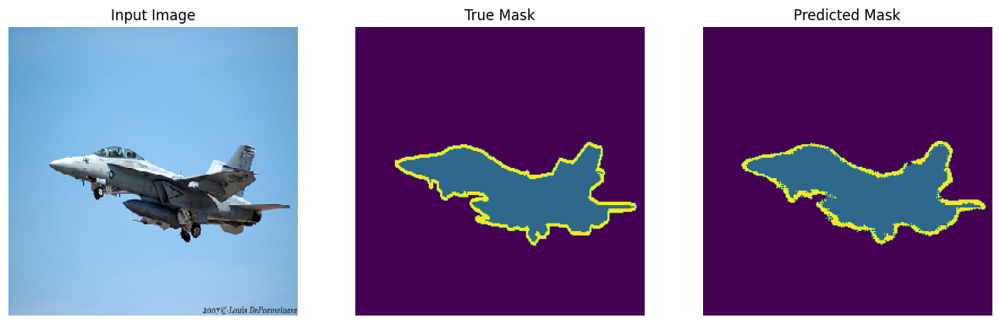

model_ue Class-wise IoU: [0.9172365, 0.8420678, 0.7058541, 0.23882177, 0.0, 0.27677506, 0.25810856, 0.38792986, 0.023701262, 0.76421803, 0.0, 0.8868803, 0.55796397, 0.2566005, 0.013426076, 0.46368888, 0.78759307, 0.7704913, 0.8687136, 0.80448246, 0.11155814, 0.0]
model_ue Mean IoU score > 0.5:  0.7905501
model_ue Mean IoU score top 3:  0.89094347
model_ue Mean IoU score: 0.45164138078689575
1/1 [==============================] - 2s 2s/step


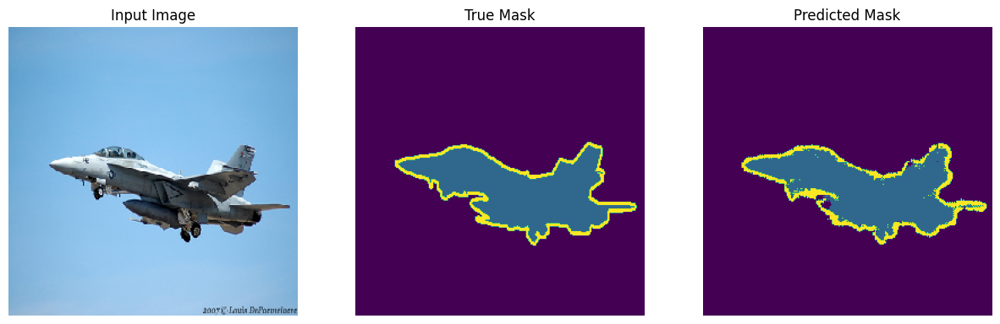

model_um Class-wise IoU: [0.8888222, 0.8097896, 0.5090534, 0.22147527, 0.0, 0.39752892, 0.13117097, 0.8149245, 0.53698033, 0.74702996, 0.0, 0.9227669, 0.438612, 0.574959, 0.4972725, 0.11023838, 0.52454275, 0.4565055, 0.15082805, 0.7730573, 0.54915017, 0.0]
model_um Mean IoU score > 0.5:  0.6955524
model_um Mean IoU score top 3:  0.8755045
model_um Mean IoU score: 0.457032173871994
1/1 [==============================] - 2s 2s/step


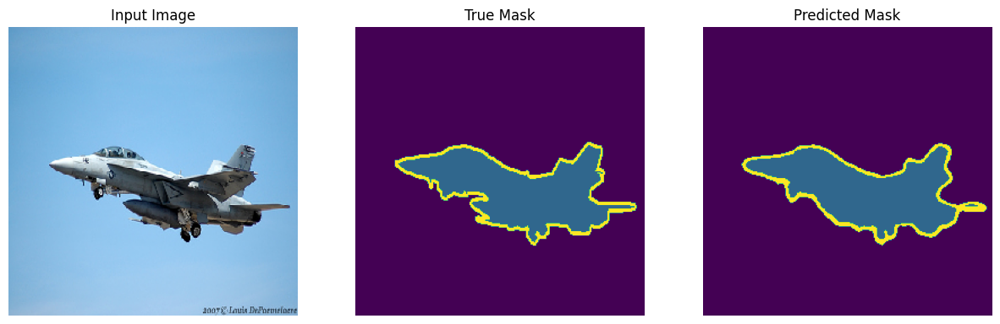

model_deeplab Class-wise IoU: [0.92436624, 0.89755493, 0.601373, 0.33330423, 0.338843, 0.83920485, 0.46898064, 0.9281403, 0.2828859, 0.6348484, 0.0, 0.71358234, 0.5562115, 0.6435331, 0.50526315, 0.48963866, 0.86906993, 0.8580562, 0.6005934, 0.89067084, 0.5453128, 0.0]
model_deeplab Mean IoU score > 0.5:  0.7338521
model_deeplab Mean IoU score top 3:  0.9166872
model_deeplab Mean IoU score: 0.5873379111289978
------------------------------
1/1 [==============================] - 0s 29ms/step


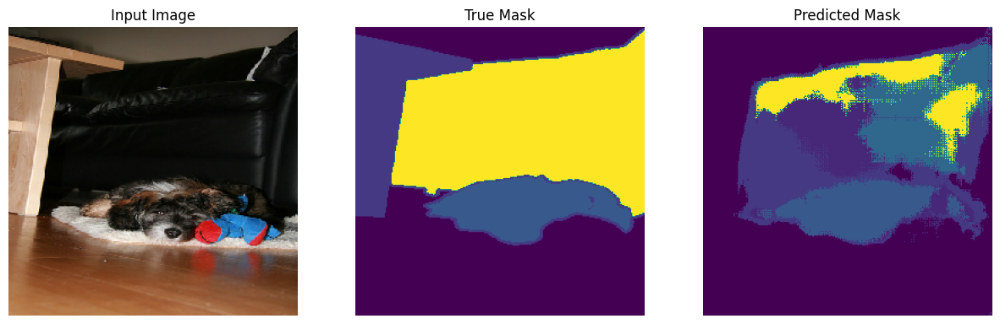

model_ue Class-wise IoU: [0.9050162, 0.6484375, 0.65673715, 0.20816615, 0.24031271, 0.5380552, 0.5097371, 0.749028, 0.96863467, 0.26151142, 0.0, 0.610351, 0.81923884, 0.82853496, 0.82752275, 0.21960114, 0.0011299435, 0.54674506, 0.3199615, 0.8423692, 0.19713633, 0.8540146]
model_ue Mean IoU score > 0.5:  0.7360301
model_ue Mean IoU score top 3:  0.9092218
model_ue Mean IoU score: 0.5341928005218506
1/1 [==============================] - 0s 28ms/step


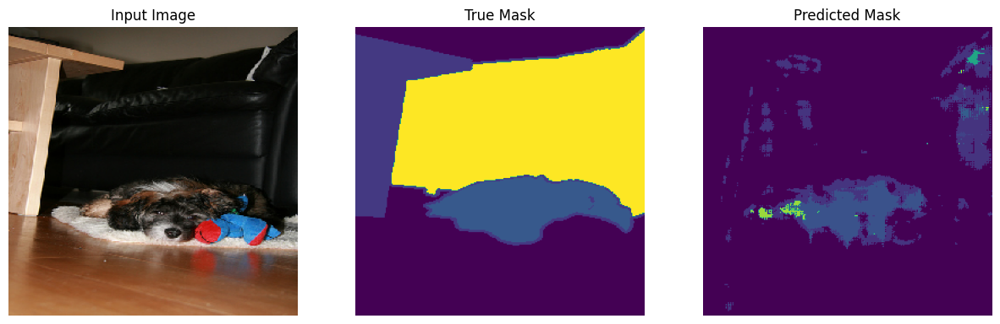

model_um Class-wise IoU: [0.8988015, 0.6381885, 0.6624096, 0.206335, 0.15690146, 0.6332821, 0.17317288, 0.71548885, 0.9041172, 0.21147902, 0.0, 0.9002495, 0.71926767, 0.5305975, 0.2241157, 0.084790036, 0.07893274, 0.72941923, 0.09406726, 0.6526118, 0.27098352, 0.39685908]
model_um Mean IoU score > 0.5:  0.7258576
model_um Mean IoU score top 3:  0.9010561
model_um Mean IoU score: 0.44918501377105713
1/1 [==============================] - 0s 24ms/step


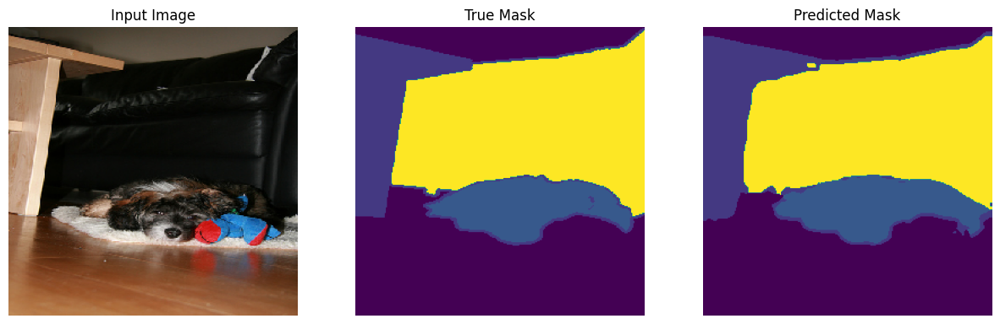

model_deeplab Class-wise IoU: [0.93259054, 0.56513166, 0.71991175, 0.35906014, 0.6489893, 0.7095331, 0.4248267, 0.85885, 0.89928687, 0.46103895, 0.0, 0.9734535, 0.6571028, 0.81151336, 0.8462368, 0.44291475, 0.14943554, 0.97158056, 0.79881966, 0.66020024, 0.5455321, 0.5400534]
model_deeplab Mean IoU score > 0.5:  0.75867414
model_deeplab Mean IoU score top 3:  0.9592082
model_deeplab Mean IoU score: 0.6352755427360535
------------------------------
1/1 [==============================] - 0s 33ms/step


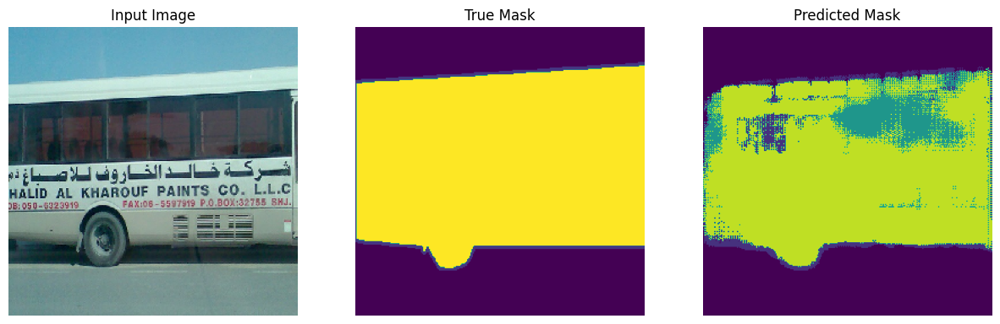

model_ue Class-wise IoU: [0.9194037, 0.7304502, 0.5770537, 0.22170815, 0.7165696, 0.639903, 0.29315507, 0.72917956, 0.4221936, 0.19161548, 0.19534196, 0.69627625, 0.82210326, 0.32436258, 0.53945524, 0.0, 0.8177205, 0.0, 0.18675642, 0.78721255, 0.03372681, 0.0]
model_ue Mean IoU score > 0.5:  0.72502977
model_ue Mean IoU score top 3:  0.8530758
model_ue Mean IoU score: 0.4474630653858185
1/1 [==============================] - 0s 24ms/step


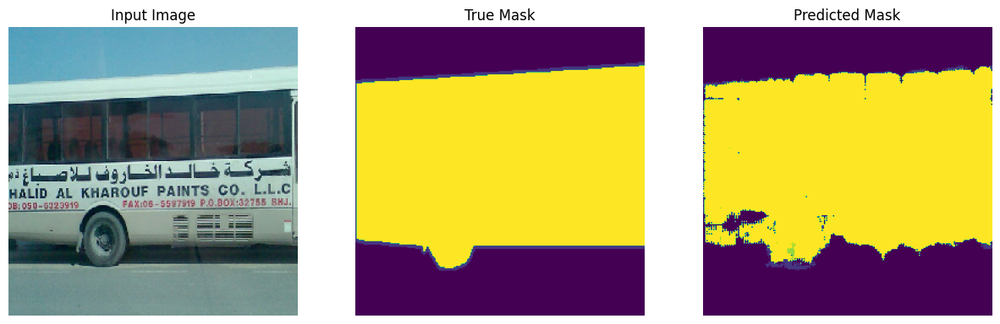

model_um Class-wise IoU: [0.9173303, 0.36023846, 0.70169556, 0.26892033, 0.8533893, 0.5506505, 0.25660345, 0.8310377, 0.5945083, 0.7764221, 0.28761443, 0.80221134, 0.7760427, 0.5697839, 0.5871586, 0.0, 0.819253, 0.0, 0.6019995, 0.8658405, 0.10623808, 0.0]
model_um Mean IoU score > 0.5:  0.7319518
model_um Mean IoU score top 3:  0.8788534
model_um Mean IoU score: 0.5239517688751221
1/1 [==============================] - 0s 31ms/step


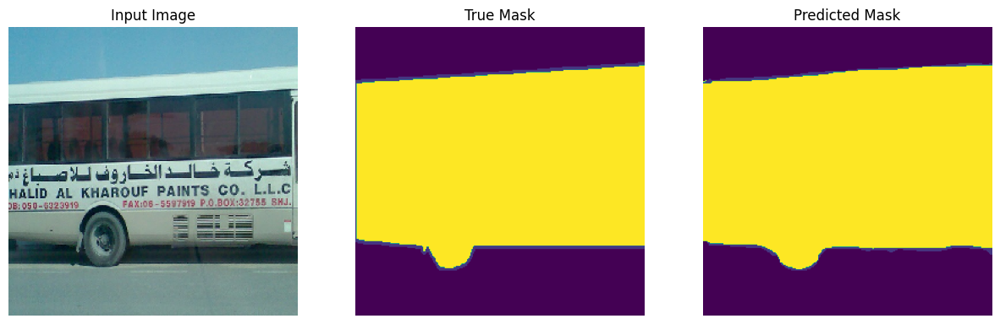

model_deeplab Class-wise IoU: [0.92073363, 0.741174, 0.6194066, 0.27585113, 0.7081322, 0.69634193, 0.39552596, 0.8344546, 0.78361475, 0.5389121, 0.30075547, 0.941737, 0.9241782, 0.79882056, 0.46335557, 0.0, 0.81525356, 0.0, 0.08138516, 0.9431176, 0.00010250103, 0.0]
model_deeplab Mean IoU score > 0.5:  0.7896828
model_deeplab Mean IoU score top 3:  0.9363443
model_deeplab Mean IoU score: 0.5355842113494873
------------------------------
1/1 [==============================] - 0s 29ms/step


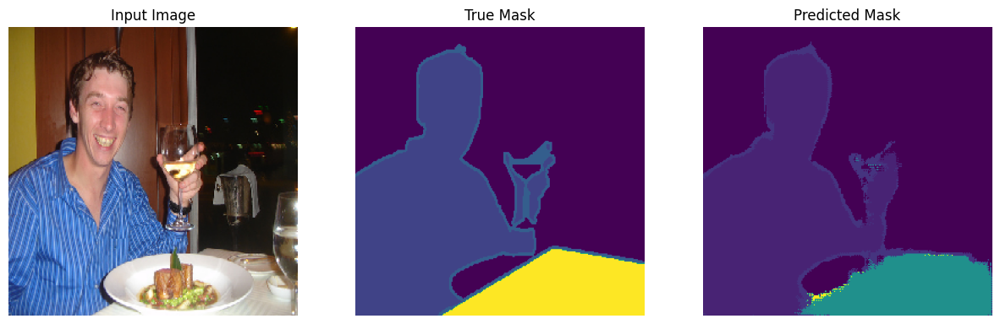

model_ue Class-wise IoU: [0.90710074, 0.8447407, 0.71516937, 0.2492716, 0.0, 0.39258897, 0.07853261, 0.61468124, 0.098908156, 0.0, 0.35946548, 0.7304477, 0.59101987, 0.7317475, 0.312756, 0.3855214, 0.94520676, 0.243533, 0.93189067, 0.6417224, 0.39179376, 0.24295461]
model_ue Mean IoU score > 0.5:  0.7653727
model_ue Mean IoU score top 3:  0.9280661
model_ue Mean IoU score: 0.4731387794017792
1/1 [==============================] - 0s 35ms/step


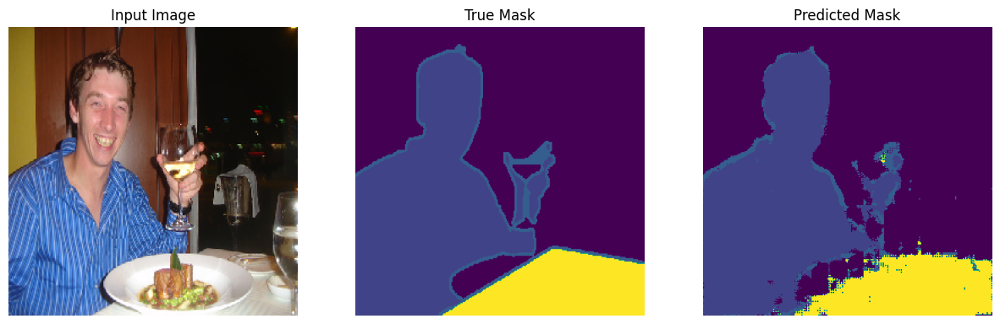

model_um Class-wise IoU: [0.913566, 0.85841656, 0.6800004, 0.2824546, 0.0, 0.69990546, 0.0, 0.8423562, 0.0, 0.0, 0.59962815, 0.8927267, 0.6300996, 0.7877392, 0.4953626, 0.107732095, 0.6859765, 0.8788494, 0.46843776, 0.836099, 0.41220453, 0.8759475]
model_um Mean IoU score > 0.5:  0.78317773
model_um Mean IoU score top 3:  0.89504737
model_um Mean IoU score: 0.5430682897567749
1/1 [==============================] - 0s 24ms/step


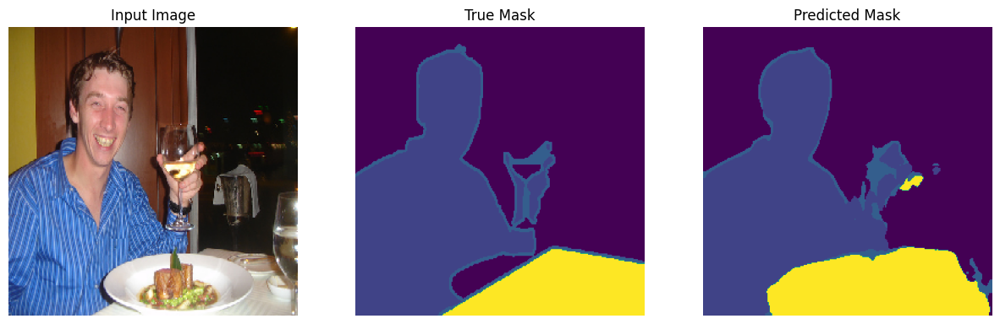

model_deeplab Class-wise IoU: [0.9049087, 0.8273675, 0.7480604, 0.27306443, 0.0, 0.62028795, 0.086660475, 0.9544757, 0.7827476, 0.0, 0.7181696, 0.93236494, 0.5840654, 0.89314616, 0.4023494, 0.4185726, 0.756403, 0.89901483, 0.05734209, 0.8040713, 0.57135934, 0.95922697]
model_deeplab Mean IoU score > 0.5:  0.79704463
model_deeplab Mean IoU score top 3:  0.94868916
model_deeplab Mean IoU score: 0.5997117757797241
------------------------------
1/1 [==============================] - 0s 29ms/step


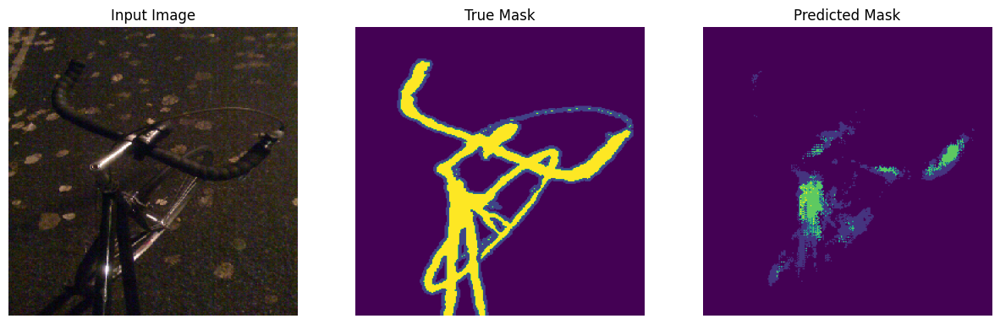

model_ue Class-wise IoU: [0.92377853, 0.71274894, 0.79242814, 0.25640908, 0.21836588, 0.8100763, 0.6424374, 0.6700188, 0.9320591, 0.0, 0.34801102, 0.0, 0.0, 0.40092477, 0.07450981, 0.11221429, 0.8185427, 0.7670363, 0.0, 0.0, 0.56759036, 0.5017342]
model_ue Mean IoU score > 0.5:  0.73985916
model_ue Mean IoU score top 3:  0.8914601
model_ue Mean IoU score: 0.43404024839401245
1/1 [==============================] - 0s 25ms/step


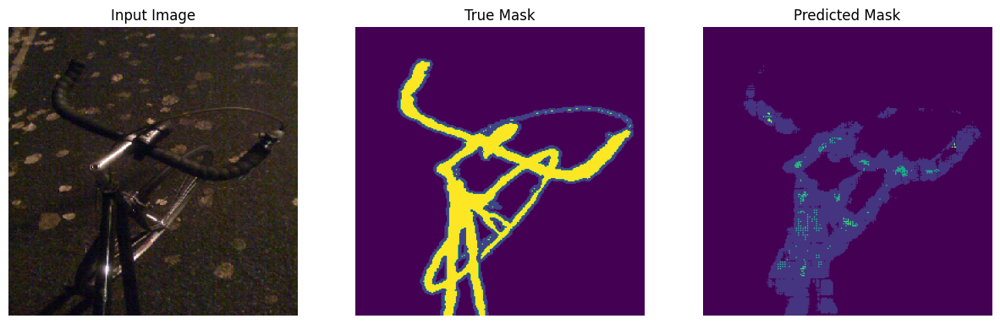

model_um Class-wise IoU: [0.91702044, 0.5949308, 0.815903, 0.23947749, 0.33137256, 0.8026016, 0.152183, 0.76421094, 0.38450032, 0.0, 0.772471, nan, 0.0, 0.6670925, 0.06607658, 0.024087124, 0.33930516, 0.6970124, 0.0, 0.0, 0.50178534, 0.6640092]
model_um Mean IoU score > 0.5:  0.7197037
model_um Mean IoU score top 3:  0.84517497
model_um Mean IoU score: 0.4159066379070282
1/1 [==============================] - 0s 37ms/step


/tmp/ipykernel_45182/758901498.py:35: RuntimeWarning: invalid value encountered in scalar divide
  iou = true_positives / (true_positives + false_positives + false_negatives)


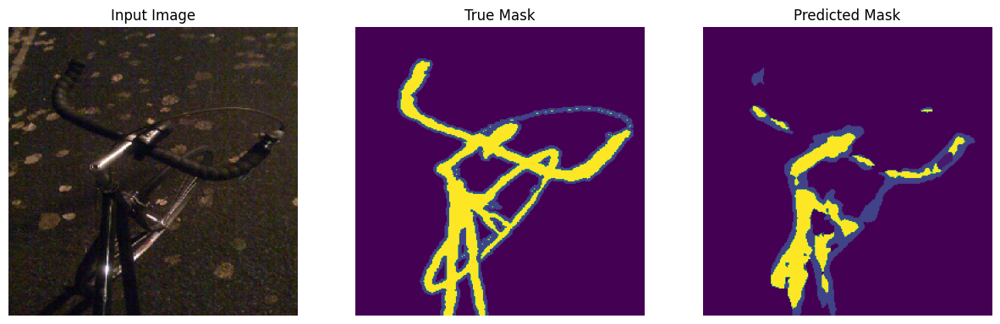

model_deeplab Class-wise IoU: [0.9389019, 0.69581556, 0.78758466, 0.3277431, 0.8221303, 0.8254481, 0.70747125, 0.90057987, 0.89960366, 0.0, 0.80090535, nan, 0.0, 0.7764427, 0.6512739, 0.36581364, 0.45000622, 0.9556717, 0.0, nan, 0.5930644, 0.93752295]
model_deeplab Mean IoU score > 0.5:  0.8066011
model_deeplab Mean IoU score top 3:  0.9440322
model_deeplab Mean IoU score: 0.6217989921569824
------------------------------
1/1 [==============================] - 0s 33ms/step


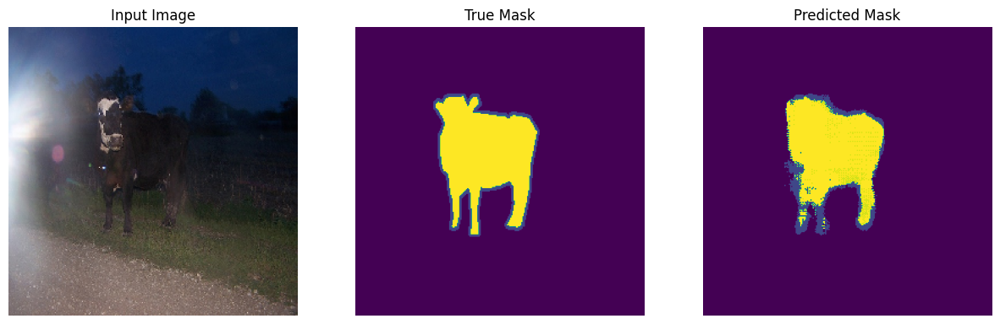

model_ue Class-wise IoU: [0.92890596, 0.88716626, 0.5866797, 0.26218638, 0.31034482, 0.5286531, 0.054590352, 0.0, 0.44747257, 0.7180483, 0.0, 0.0, 0.66277534, 0.72075915, 0.70647395, 0.0, 0.952584, 0.92207515, 0.15864244, 0.8976006, 0.18588771, 0.0]
model_ue Mean IoU score > 0.5:  0.77379286
model_ue Mean IoU score top 3:  0.9345217
model_ue Mean IoU score: 0.45140209794044495
1/1 [==============================] - 0s 34ms/step


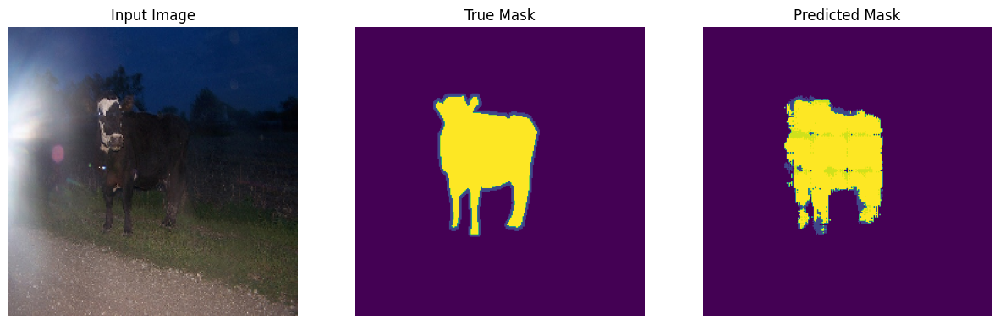

model_um Class-wise IoU: [0.9322097, 0.8868694, 0.67788404, 0.22692832, 0.2392112, 0.8194814, 0.07408435, 0.12563871, 0.53429186, 0.63849175, 0.0, nan, 0.6156314, 0.8281292, 0.7529266, 0.0, 0.8910853, 0.89777654, 0.75496995, 0.7856177, 0.0, 0.0]
model_um Mean IoU score > 0.5:  0.77041256
model_um Mean IoU score top 3:  0.90702385
model_um Mean IoU score: 0.5086299180984497
1/1 [==============================] - 0s 40ms/step


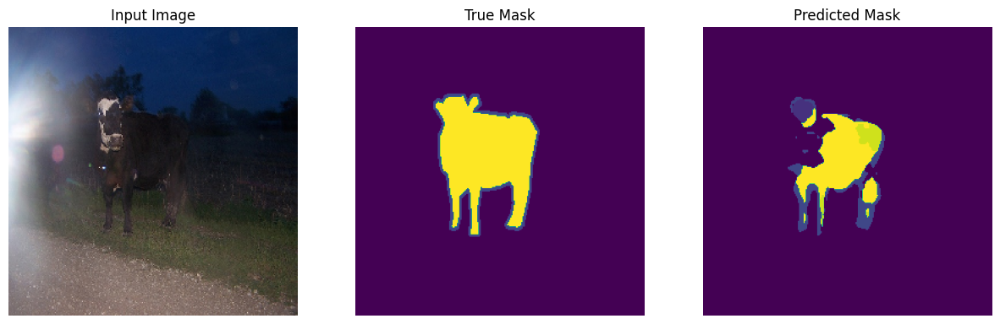

model_deeplab Class-wise IoU: [0.94037473, 0.9300077, 0.6815181, 0.31769308, 0.35664335, 0.8343567, 0.05130641, 0.7621465, 0.84636587, 0.714655, 0.0, 0.0, 0.7311739, 0.9186933, 0.7237974, 0.0, 0.9635393, 0.89283574, 0.49834496, 0.8895473, 0.0, nan]
model_deeplab Mean IoU score > 0.5:  0.8330009
model_deeplab Mean IoU score top 3:  0.9446406
model_deeplab Mean IoU score: 0.5739523768424988
------------------------------
1/1 [==============================] - 0s 38ms/step


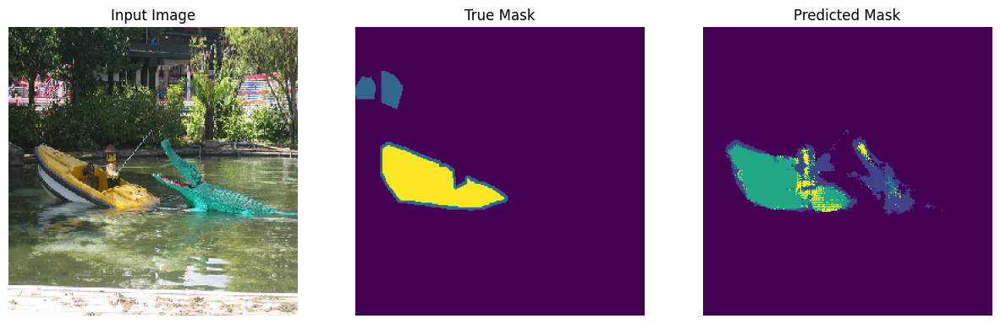

model_ue Class-wise IoU: [0.9341541, 0.64525837, 0.7828114, 0.35262832, 0.9004953, 0.9056856, 0.048819106, 0.88412726, 0.0, 0.6103107, 0.34800386, 0.8822068, 0.73839414, 0.7703113, 0.76586807, 0.52293277, 0.00057186425, 0.0, 0.0, 0.90964967, 0.16025466, 0.73885006]
model_ue Mean IoU score > 0.5:  0.78507537
model_ue Mean IoU score top 3:  0.91649646
model_ue Mean IoU score: 0.5409696698188782
1/1 [==============================] - 0s 38ms/step


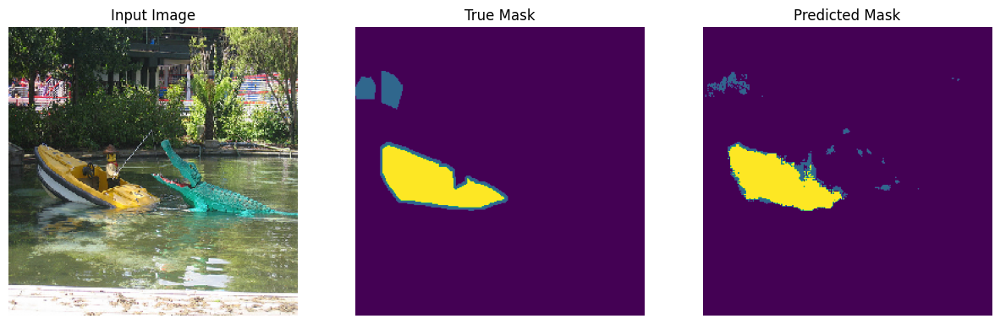

model_um Class-wise IoU: [0.9135679, 0.57427275, 0.70902324, 0.23308426, 0.3325035, 0.9213375, 0.12831137, 0.8452306, 0.0, 0.2824436, 0.5419143, 0.844234, 0.38897452, 0.40619582, 0.58647597, 0.01488461, 0.06360403, 0.0, 0.0, 0.9079498, 0.041779257, 0.6978536]
model_um Mean IoU score > 0.5:  0.754186
model_um Mean IoU score top 3:  0.914285
model_um Mean IoU score: 0.42880183458328247
1/1 [==============================] - 0s 39ms/step


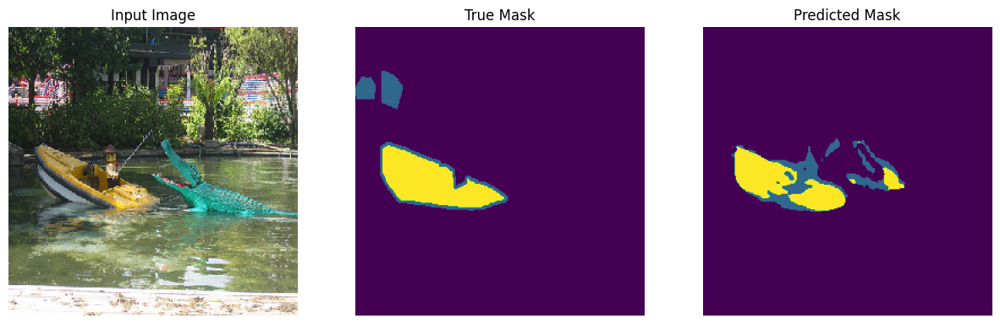

model_deeplab Class-wise IoU: [0.9338126, 0.9147395, 0.72473335, 0.28320897, 0.26970693, 0.8279129, 0.12721822, 0.9167874, 0.0, 0.8758005, 0.41566196, 0.9204096, 0.74764496, 0.42404762, 0.23668951, 0.71699536, 0.5618676, 0.0, 0.0, 0.8829499, 0.36543104, 0.83298427]
model_deeplab Mean IoU score > 0.5:  0.8213864
model_deeplab Mean IoU score top 3:  0.9236699
model_deeplab Mean IoU score: 0.5444818735122681
------------------------------
1/1 [==============================] - 0s 43ms/step


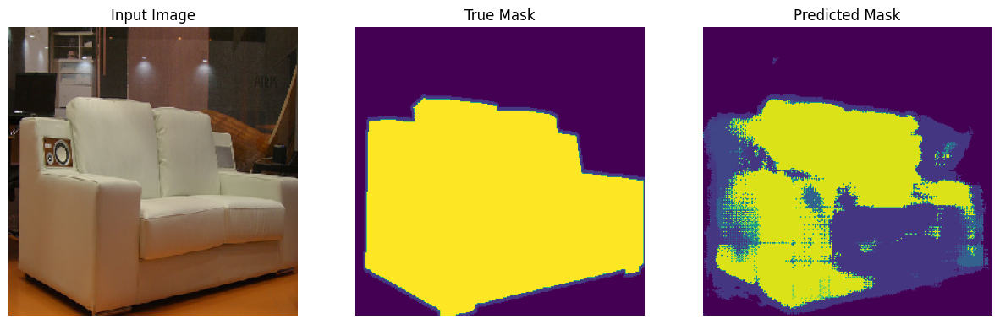

model_ue Class-wise IoU: [0.9328347, 0.6422051, 0.6303137, 0.3819406, 0.7584011, 0.016110433, 0.18182415, 0.7445977, 0.004576659, 0.58242404, 0.6457136, 0.6776545, 0.0, 0.41973394, 0.35226518, 0.08911046, 0.7350035, 0.8374183, 0.45263702, 0.89296204, 0.0, 0.0]
model_ue Mean IoU score > 0.5:  0.7345026
model_ue Mean IoU score top 3:  0.8877383
model_ue Mean IoU score: 0.45353299379348755
1/1 [==============================] - 0s 39ms/step


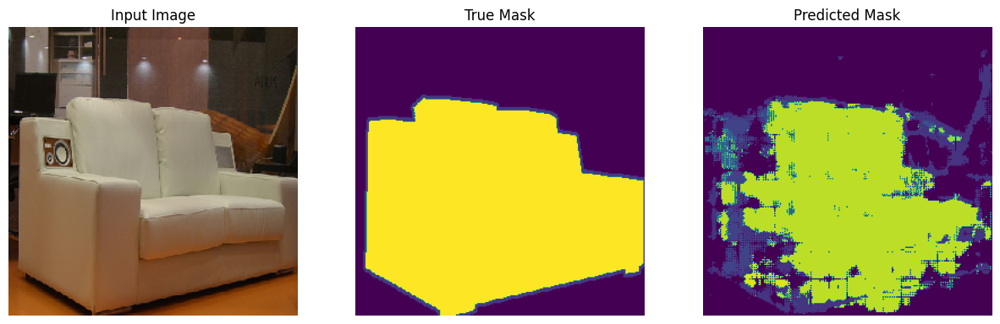

model_um Class-wise IoU: [0.9049456, 0.8317073, 0.646878, 0.42973688, 0.79223055, 0.6396149, 0.22086957, 0.77572036, 0.0, 0.79596144, 0.18040249, 0.6529183, 0.0, 0.85793334, 0.6923992, 0.07622433, 0.8332339, 0.7536227, 0.56663, 0.6528633, 0.0, 0.0]
model_um Mean IoU score > 0.5:  0.74261856
model_um Mean IoU score top 3:  0.8653709
model_um Mean IoU score: 0.5138132572174072
1/1 [==============================] - 0s 36ms/step


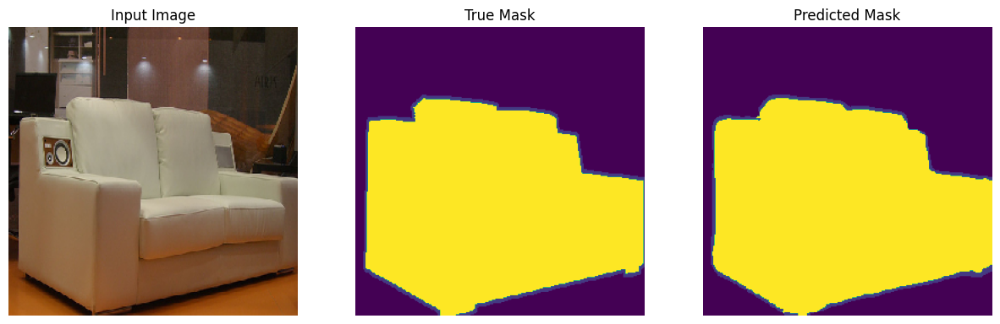

model_deeplab Class-wise IoU: [0.90112275, 0.9035913, 0.65647185, 0.26305625, 0.8846282, 0.6231348, 0.5154524, 0.86113244, 0.60032105, 0.743779, 0.311089, 0.75698936, 0.0, 0.69717443, 0.45984665, 0.49013996, 0.6970244, 0.84578145, 0.73939586, 0.89313525, 0.0, nan]
model_deeplab Mean IoU score > 0.5:  0.754609
model_deeplab Mean IoU score top 3:  0.8992831
model_deeplab Mean IoU score: 0.6115841269493103
------------------------------
1/1 [==============================] - 0s 44ms/step


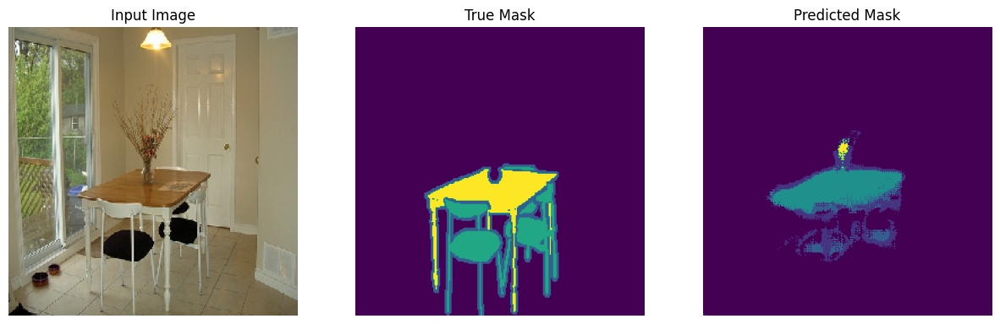

model_ue Class-wise IoU: [0.8935081, 0.44894028, 0.74172556, 0.23062402, 0.56866324, 0.5773339, 0.050357092, 0.0, 0.23813877, 0.15678987, 0.7848629, 0.0, 0.19822162, 0.6589798, 0.37838328, 0.2146074, 0.4401321, 0.40429917, 0.033496913, 0.47460163, 0.66271716, 0.5297651]
model_ue Mean IoU score > 0.5:  0.6771945
model_ue Mean IoU score top 3:  0.8066988
model_ue Mean IoU score: 0.39482489228248596
1/1 [==============================] - 0s 41ms/step


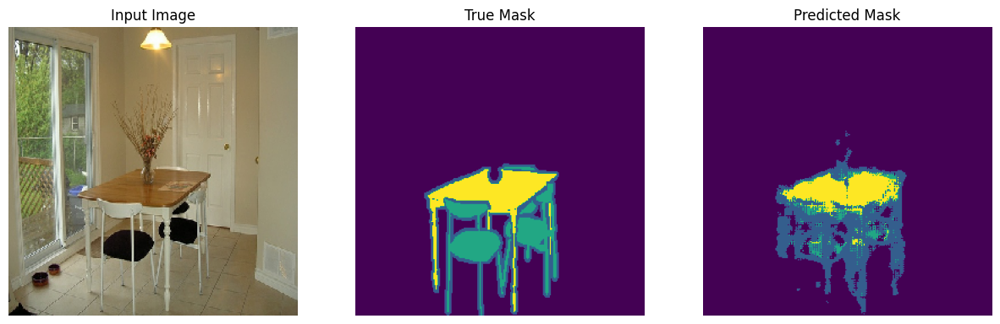

model_um Class-wise IoU: [0.89611965, 0.42640364, 0.73736906, 0.27446458, 0.8278168, 0.73332864, 0.159327, 0.0, 0.7133497, 0.6461152, 0.7659309, 0.0, 0.59018123, 0.5887811, 0.49854815, 0.09532667, 0.58570427, 0.79767966, 0.334511, 0.8173189, 0.5341371, 0.7216421]
model_um Mean IoU score > 0.5:  0.7111053
model_um Mean IoU score top 3:  0.84708506
model_um Mean IoU score: 0.5338206887245178
1/1 [==============================] - 0s 40ms/step


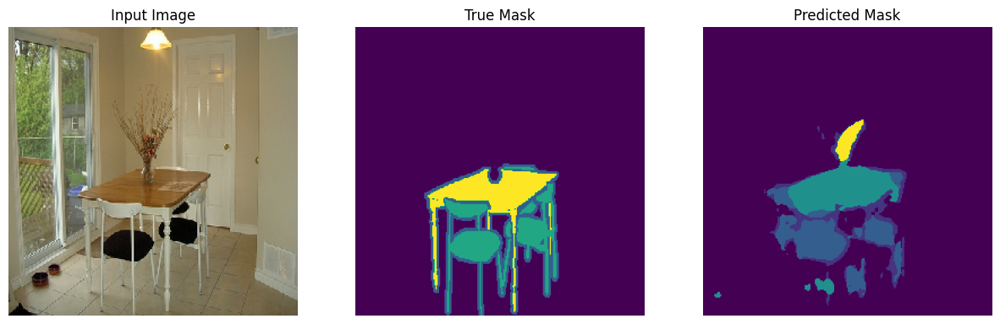

model_deeplab Class-wise IoU: [0.91110885, 0.13111112, 0.74273044, 0.28362042, 0.39030474, 0.9253749, 0.19004667, 0.0, 0.36366385, 0.89928406, 0.76979095, nan, 0.6340753, 0.41036645, 0.51114374, 0.29950142, 0.77560973, 0.6896358, 0.6555465, 0.8708269, 0.7358528, 0.6730316]
model_deeplab Mean IoU score > 0.5:  0.75338554
model_deeplab Mean IoU score top 3:  0.91192263
model_deeplab Mean IoU score: 0.5648869276046753
------------------------------
1/1 [==============================] - 3s 3s/step


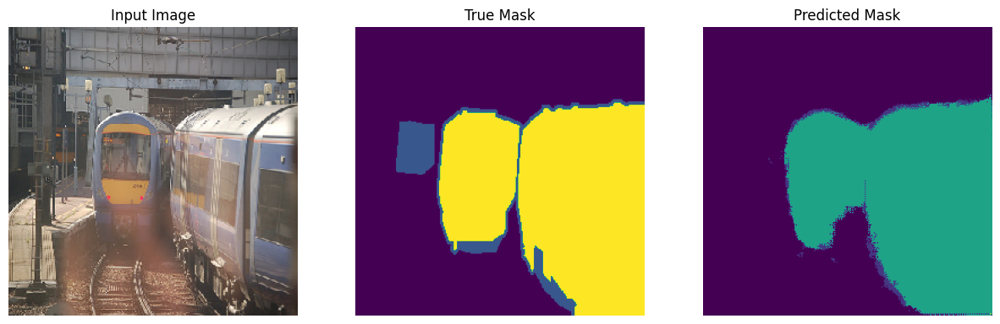

model_ue Class-wise IoU: [0.94639784, nan, 0.0, 0.28997853, nan, 0.6942043, nan, 0.0, nan, 0.0, 0.0, 0.9267462, 0.0, nan, nan, nan, nan, 0.0, 0.0, 0.0, nan, nan]
model_ue Mean IoU score > 0.5:  0.85578275
model_ue Mean IoU score top 3:  0.85578275
model_ue Mean IoU score: 0.23811055719852448
1/1 [==============================] - 1s 1s/step


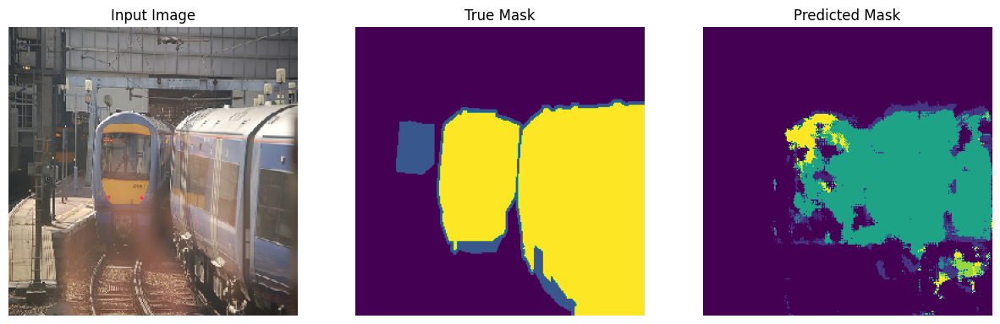

model_um Class-wise IoU: [0.89975864, nan, 0.0, 0.19249353, 0.0, 0.75420403, 0.0, 0.0, nan, 0.0, nan, 0.5775074, nan, 0.0, 0.0, nan, 0.0, 0.0, 0.0, 0.0, 0.0, nan]
model_um Mean IoU score > 0.5:  0.74382335
model_um Mean IoU score top 3:  0.74382335
model_um Mean IoU score: 0.1514977216720581
1/1 [==============================] - 1s 1s/step


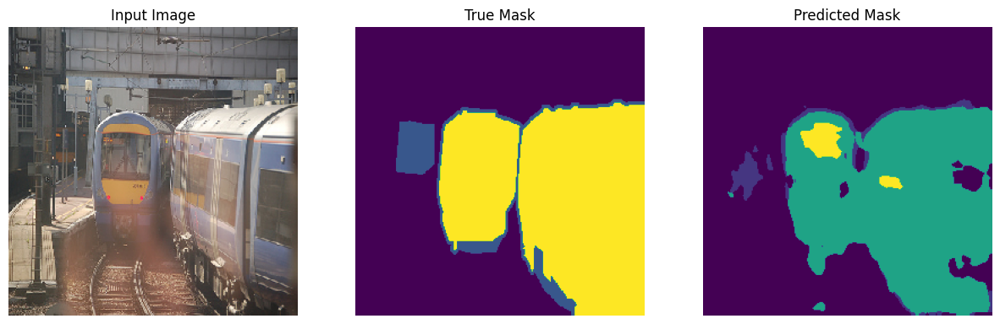

model_deeplab Class-wise IoU: [0.94833255, nan, nan, 0.3649197, nan, 0.93186575, nan, nan, nan, nan, nan, 0.79944783, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan]
model_deeplab Mean IoU score > 0.5:  0.89321536
model_deeplab Mean IoU score top 3:  0.89321536
model_deeplab Mean IoU score: 0.6089131236076355
------------------------------


In [28]:
model_list = {"model_ue":model_ue, "model_um":model_um, "model_deeplab":model_deeplab}
calculate_miou_custom(model_list, num_classes)

---


In [37]:
def calculate_iou(y_true, y_pred, smooth=1e-6):
    y_pred = np.squeeze(y_pred,-1)
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / (np.sum(union) + smooth)
    return iou

In [ ]:
# 저장된 모델의 경로
model_path_fcn= './FCN.keras'

# 모델 로드
model_fcn = tf.keras.models.load_model(model_path_fcn)

In [ ]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask
ious = []  # IOU 값을 저장할 리스트


In [33]:
pickle_file_inverse_mapping = 'inverse_mapping.pkl'
if not os.path.exists(pickle_file_inverse_mapping):

    inverse_mapping = create_inverse_mapping(class_color_mapping)
    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file_inverse_mapping, 'wb') as file:
        pickle.dump(inverse_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file_inverse_mapping, 'rb') as file:
        inverse_mapping = pickle.load(file)

In [63]:
# 데이터셋에서 마스크 목록 추출
pickle_file = 'class_color_mapping.pkl'
if not os.path.exists(pickle_file):
    # masks 변수는 이미 정의되어 있어야 합니다.
    class_color_mapping = extract_class_color_mapping(masks)

    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file, 'wb') as file:
        pickle.dump(class_color_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file, 'rb') as file:
        class_color_mapping = pickle.load(file)

In [64]:
class_color_mapping

{(0, 0, 0): 0,
 (128, 0, 0): 1,
 (192, 128, 128): 2,
 (224, 224, 192): 3,
 (0, 64, 128): 4,
 (64, 0, 128): 5,
 (192, 0, 0): 6,
 (128, 128, 0): 7,
 (128, 0, 128): 8,
 (0, 0, 128): 9,
 (192, 128, 0): 10,
 (128, 192, 0): 11,
 (64, 128, 128): 12,
 (192, 0, 128): 13,
 (64, 128, 0): 14,
 (0, 128, 0): 15,
 (128, 128, 128): 16,
 (64, 0, 0): 17,
 (0, 192, 0): 18,
 (0, 128, 128): 19,
 (0, 64, 0): 20,
 (128, 64, 0): 21}

In [37]:
inverse_mapping

{0: (0, 0, 0),
 1: (128, 0, 0),
 2: (192, 128, 128),
 3: (224, 224, 192),
 4: (0, 64, 128),
 5: (64, 0, 128),
 6: (192, 0, 0),
 7: (128, 128, 0),
 8: (128, 0, 128),
 9: (0, 0, 128),
 10: (192, 128, 0),
 11: (128, 192, 0),
 12: (64, 128, 128),
 13: (192, 0, 128),
 14: (64, 128, 0),
 15: (0, 128, 0),
 16: (128, 128, 128),
 17: (64, 0, 0),
 18: (0, 192, 0),
 19: (0, 128, 128),
 20: (0, 64, 0),
 21: (128, 64, 0)}

In [80]:
def calculate_miou_custom(model_name,model, num_classes):
    # 테스트 데이터셋에서 모델 예측 수행
    for image, mask in test_dataset.take(10):

        # for model_name, model in model_list.items():
      y_pred = model.predict(image)
      y_true = mask

      y_pred = tf.argmax(y_pred, axis=-1)
      y_pred = np.squeeze(y_pred[..., tf.newaxis],-1)
      # print(y_pred.shape)
      restored_color_mask = map_integer_mask_to_color(np.array(mask[0]), inverse_mapping)
      display([image[0], restored_color_mask, y_pred[0]])

      # MeanIoU 인스턴스 생성
      iou_metric = MeanIoU(num_classes=num_classes)

      # 업데이트
      iou_metric.update_state(y_true, y_pred)

      # confusion matrix 얻기
      conf_mat = iou_metric.get_weights()[0]

      # 각 클래스별 IoU 계산
      ious = []
      for i in range(num_classes):
          # 대각선 값은 교차, 행의 합과 열의 합은 합집합을 나타냄
          true_positives = conf_mat[i, i]
          false_negatives = np.sum(conf_mat[i, :]) - true_positives
          false_positives = np.sum(conf_mat[:, i]) - true_positives
          iou = true_positives / (true_positives + false_positives + false_negatives)
          ious.append(iou)

      # 출력
      print(f"{model_name} Class-wise IoU:", ious)

      # 0.5보다 큰 값들을 필터링

      filtered_values = np.array([x for x in ious if x > 0.5])
      filtered_data = filtered_values[~np.isnan(filtered_values)]

      # 필터링된 값들의 평균 계산
      ious_up = filtered_data.mean()
      print(f"{model_name} Mean IoU score > 0.5: ", ious_up)

      # 상위 3값의 평균 계산
      ious_top3 = np.mean(np.sort(filtered_data)[-3:])
      print(f"{model_name} Mean IoU score top 3: ", ious_top3)

      miou_score = calculate_miou(y_true.numpy(), y_pred, num_classes)
      print(f"{model_name} Mean IoU score: {miou_score}")
      print("-"*30)

In [81]:
def map_integer_mask_to_color(integer_mask, reverse_mapping):
    color_mask = np.zeros((integer_mask.shape[0], integer_mask.shape[1], 3), dtype=np.uint8)
    for row in range(integer_mask.shape[0]):
        for col in range(integer_mask.shape[1]):
            class_idx = integer_mask[row, col]
            print(class_idx)
            color = reverse_mapping[class_idx]
            # 컬러 값을 [0, 255] 범위로 스케일링
            scaled_color = np.clip(color, 0, 255)
            color_mask[row, col] = scaled_color

1/1 [==============================] - 0s 22ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


TypeError: Image data of dtype object cannot be converted to float

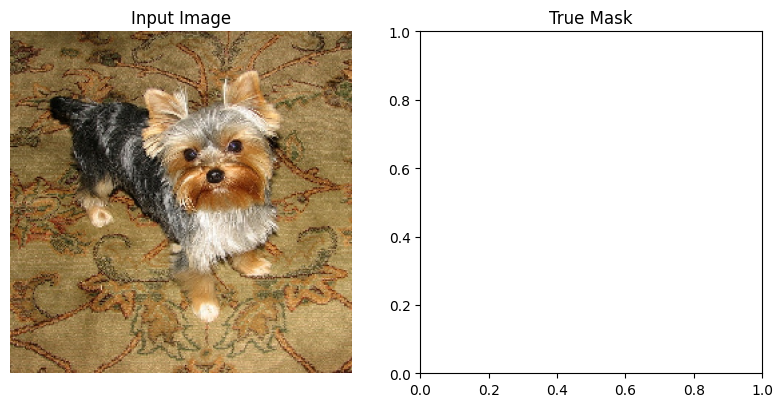

In [82]:
calculate_miou_custom("deeplab", model_deeplab, 22)

In [73]:
for image, mask in test_dataset:  # test_dataset을 순회
    pred_mask = model_fcn.predict(image)  # 모델을 사용하여 마스크 예측
    pred_mask = create_mask(pred_mask)  # 예측된 확률을 마스크로 변환

    iou = calculate_iou(mask.numpy(), pred_mask.numpy())  # `.numpy()`는 EagerTensor를 NumPy 배열로 변환
    ious.append(iou)  # 계산된 IOU를 리스트에 추가

mean_iou = np.mean(ious)  # 평균 IOU 계산
print(f"Mean IOU: {mean_iou}")


NameError: name 'model_fcn' is not defined